In [1]:
import pickle
import numpy as np

with open('sphereDataset.pickle', 'rb') as handle:
    dataset = pickle.load(handle)

In [2]:
import torch
from tqdm import tqdm
from matplotlib import pyplot as plt

In [14]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class Diffusion:
    def __init__(self, noise_steps=1000, beta_start=1e-4, beta_end=0.02, img_size=1000, device=device):
        self.noise_steps = noise_steps
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.img_size = img_size
        self.device = device
        
        self.beta = self.prepare_noise_schedule().to(device)
        self.alpha = 1-self.beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0) #cumulative product.
        
    def prepare_noise_schedule(self, mode='linear'):
        if mode=='linear':
            return torch.linspace(self.beta_start, self.beta_end, self.noise_steps)
        if mode=='cos':
            #TODO : open ai cos schedule
            pass
        
    def noise_images(self, x, t):
        # Generate X_t in a single step as described in the paper
        # x_t = sqrt(alpha_hat)*x_0 + sqrt(1-alpha_hat)*e
        e = torch.randn_like(x)
        x_t = x*torch.sqrt(self.alpha_hat[t])[:, None, None] + torch.sqrt(1 - self.alpha_hat[t])[:, None, None]*e # ?
        return x_t, e
        
    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,))
    
    def sample(self, model, n):
        model.eval()
        # Algo 2 - Sampling
        with torch.no_grad():
            x = torch.randn((n, 3, self.img_size)).to(self.device)
            for i in tqdm(reversed(range(1, self.noise_steps)), position=0):
                t = (torch.ones(n) * i).long().to(self.device)
                predicted_noise = model(x, t)
                alpha = self.alpha[t][:, None, None]
                alpha_hat = self.alpha_hat[t][:, None, None]
                beta = self.beta[t][:, None, None]
                if i>1:
                    noise = torch.randn_like(x)
                else:
                    noise = torch.zeros_like(x)
                x = 1/torch.sqrt(alpha)*(x-((1-alpha)/torch.sqrt(1-alpha_hat))*predicted_noise)+torch.sqrt(beta)*noise
            model.train()
            x = x.clamp(-1,1)
            return x

In [4]:
from torch import nn

class UNet(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, device=device):
        super().__init__()
        self.device = device
        self.time_dim = time_dim
        self.inc = DoubleConv(c_in, 64)
        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128, 1000//2)
        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256, 1000//4)
        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256, 1000//8)
        
        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)
        
        self.up1 = Up(512, 128)
        self.sa4 = SelfAttention(128, 1000//4)
        self.up2 = Up(256, 64)
        self.sa5 = SelfAttention(64, 1000//2)
        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64,1000)
        self.outc = nn.Conv1d(64, c_out, kernel_size=1)
        
    # Sinosoidal encoding - further read
    def pos_encoding(self, t, channels):
        inv_freq = 1.0 / (10000**(torch.arange(0, channels, 2, device=self.device).float() / channels))
        
        pos_enc_a = torch.sin(t.repeat(1, channels // 2)*inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels//2)*inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc
    
    def forward(self, x, t):
        t = t.unsqueeze(-1).type(torch.float)
        t = self.pos_encoding(t, self.time_dim)
        
        # Encoder
        x1 = self.inc(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)
        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)
        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)
        
        # Bottleneck
        x4 = self.bot1(x4)
        x4 = self.bot2(x4)
        x4 = self.bot3(x4)
        
        # Decoder
        #print(x4.size())
        #print(x3.size())
        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)
        return self.outc(x)  

In [5]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, residual=False):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.conv1 = nn.Conv1d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.norm1 = nn.BatchNorm1d(mid_channels)
        self.act = nn.ReLU() ## Try Relu, leakyReLU
        self.conv2 = nn.Conv1d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.norm2 = nn.BatchNorm1d(out_channels)
        self.residual = residual
        
    def forward(self, x):
        x2 = self.conv1(x)
        x2 = self.norm1(x2)
        x2 = self.act(x2)
        x2 = self.conv2(x2)
        x2 = self.norm2(x2)
        if self.residual:
            return self.act(x+x2)
        else:
            return x2

In [6]:
class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.maxPool = nn.MaxPool1d(2)
        self.doubleConv1 = DoubleConv(in_channels, in_channels, residual=True)
        self.doubleConv2 = DoubleConv(in_channels, out_channels)
        
        self.act = nn.ReLU()
        self.linear = nn.Linear(emb_dim, out_channels)
        
    def forward(self, x, t):
        x = self.maxPool(x)
        x = self.doubleConv1(x)
        x = self.doubleConv2(x)
        #print(x.size())
        emb = self.act(t)
        emb = self.linear(emb)[:, :, None].repeat(1, 1, x.shape[-1])
        #print(emb.size())
        
        return x+emb 

In [7]:
class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        
        #self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.up = nn.ConvTranspose1d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
        self.doubleConv1 = DoubleConv(in_channels, in_channels, residual=True)
        self.doubleConv2 = DoubleConv(in_channels, out_channels, in_channels//2)
        self.act = nn.ReLU()
        self.linear = nn.Linear(emb_dim, out_channels)
        
    def forward(self, x, skip_x, t):
        #print(x.size())
        x = self.up(x)
        #print(x.size())
        if x.shape[-2:] != skip_x.shape[-2:]:
            x = nn.functional.interpolate(x, size=skip_x.shape[-2:], mode='bilinear', align_corners=True)
            #print(x.size())
        x = torch.cat([skip_x, x], dim=1)
        x = self.doubleConv1(x)
        x = self.doubleConv2(x)
        emb = self.act(t)
        emb = self.linear(emb)[:, :, None].repeat(1,1, x.shape[-1])
        return x+emb

In [8]:
class SelfAttention(nn.Module):
    def __init__(self, channels, size):
        super(SelfAttention, self).__init__()
        self.channels = channels
        self.size = size
        self.mha = nn.MultiheadAttention(channels, 4, batch_first=True)
        self.ln = nn.LayerNorm([channels])
        self.linear = nn.Linear(channels, channels)
        self.act = nn.ReLU()
    
    def forward(self, x):
        b, c, p = x.shape
        #x = x.view(b, c, h*w).permute(0,2,1)
        x = x.permute(0,2,1)
        x_ln = self.ln(x)
        attention_value, _ = self.mha(x_ln, x_ln, x_ln)
        attention_value = attention_value + x
        x = self.ln(attention_value)
        x = self.linear(x)
        x = self.act(x)
        x = self.linear(x)
        attention_value = x + attention_value
        
        return attention_value.permute(0, 2, 1)#.view(b, c, h, w)

In [9]:
def visualize(x,y,z):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    ax.scatter(x,y,z, c='b', marker='o', s=20)
    
    ax.set_box_aspect([1,1,1])
    
    # Set labels and title
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    plt.title('Uniform Random Points on a Sphere')
    ax.view_init(azim=45, elev=30)
    
    plt.show()

In [10]:
def split_indices(n, val_pct):
    n_val = int(val_pct*n)
    idxs = np.random.permutation(n)
    return idxs[n_val:], idxs[:n_val]

train_idxs, val_idxs = split_indices(10000, 0.2)

In [11]:
from torch.utils.data import TensorDataset, DataLoader

train_data = [dataset[i] for i in train_idxs]
val_data = [dataset[i] for i in val_idxs]

train_data = torch.Tensor(train_data)
val_data = torch.Tensor(train_data)

train_dataset = TensorDataset(train_data)
val_dataset = TensorDataset(val_data)

train_loader = DataLoader(train_dataset, batch_size=32)
val_loader = DataLoader(val_dataset, batch_size=32)

C:\Users\jorge\AppData\Local\Temp\ipykernel_11088\120328972.py:6: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:278.)
  train_data = torch.Tensor(train_data)


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

out


999it [00:38, 26.17it/s]


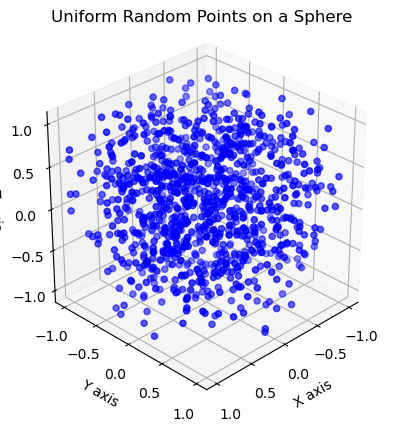

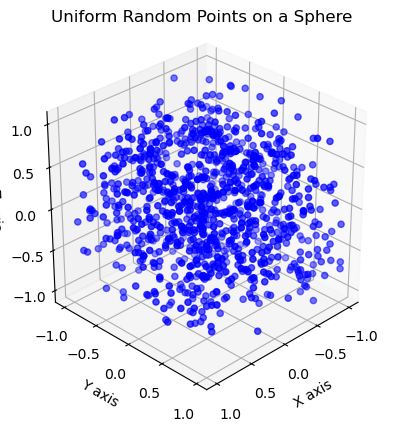

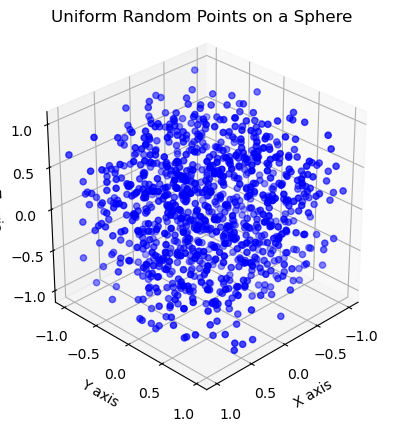

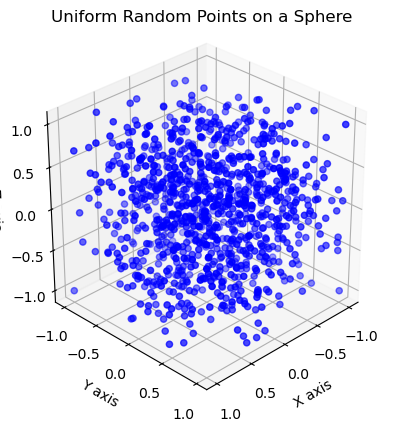

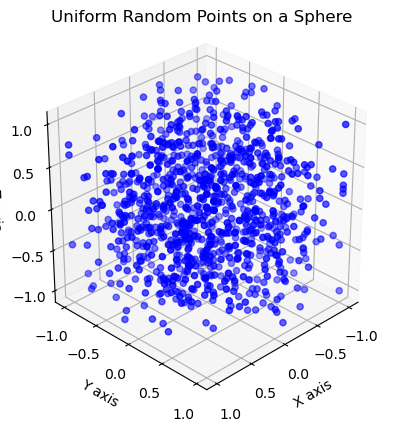

  1%|▊                                                                             | 1/100 [10:00<16:30:44, 600.45s/it]

Epoch [1/100] | Loss: 0.2097 | Val Loss: 0.1045
out


999it [00:42, 23.64it/s]


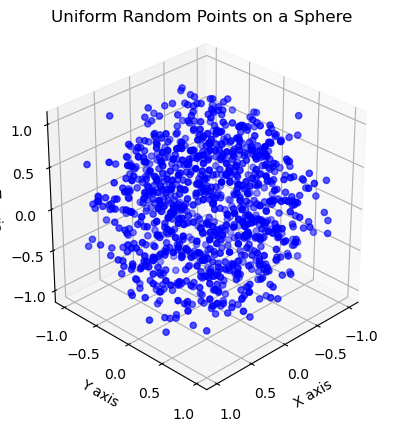

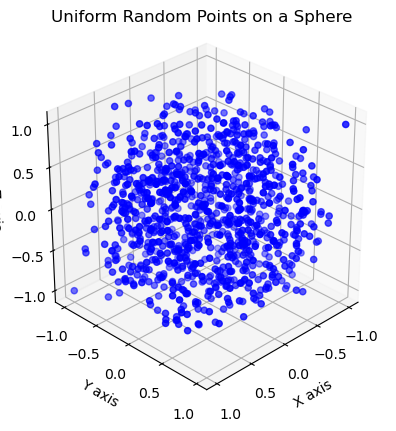

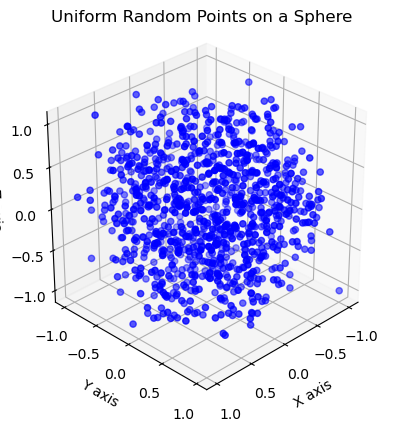

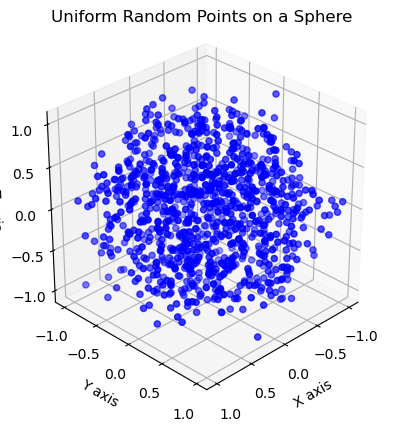

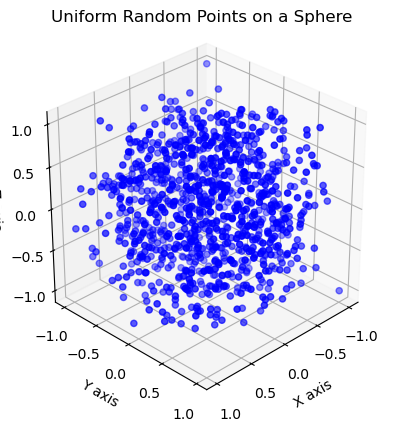

  2%|█▌                                                                            | 2/100 [14:27<11:00:31, 404.40s/it]

Epoch [2/100] | Loss: 0.1488 | Val Loss: 0.1495
out


999it [00:56, 17.81it/s]


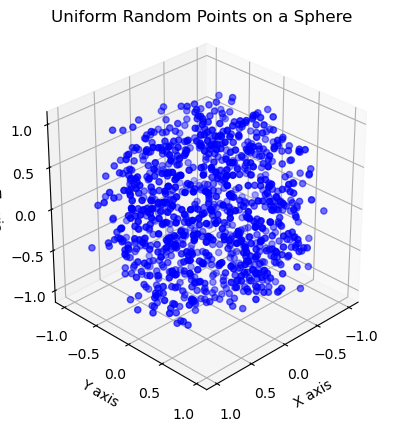

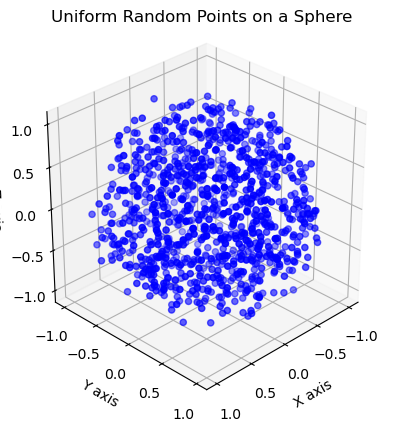

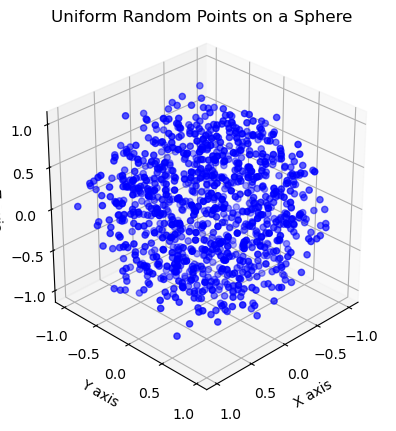

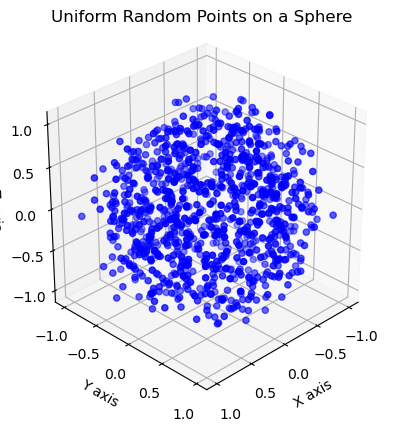

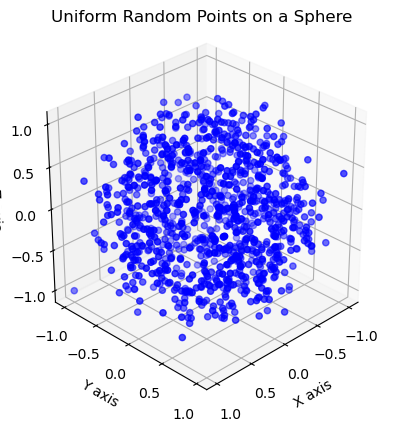

  3%|██▎                                                                            | 3/100 [18:29<8:53:51, 330.22s/it]

Epoch [3/100] | Loss: 0.1912 | Val Loss: 0.2324
out


999it [00:53, 18.57it/s]


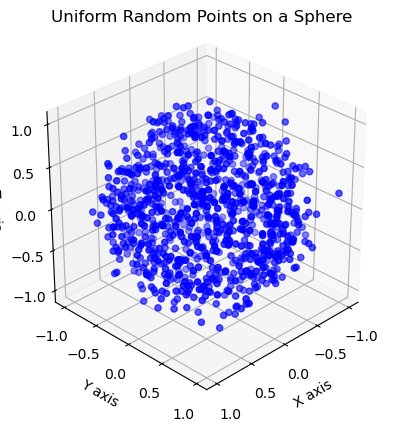

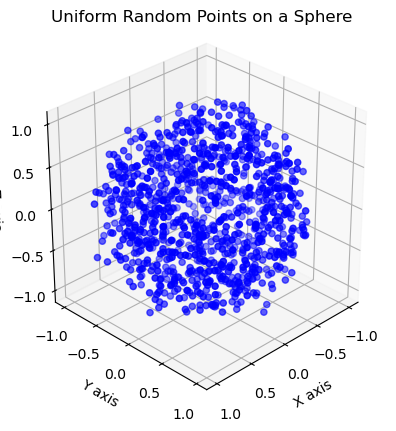

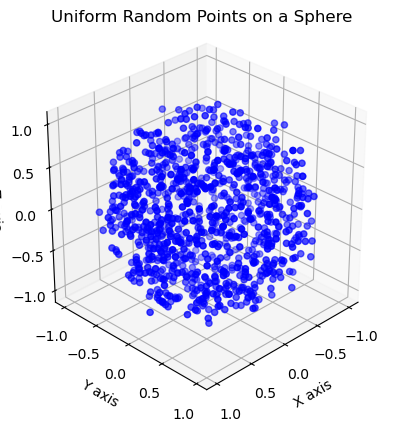

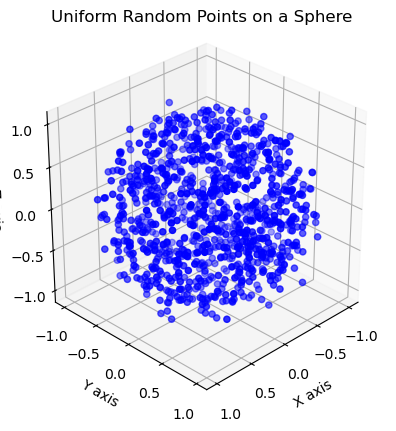

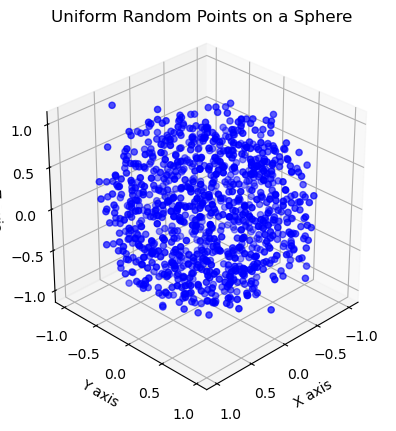

  4%|███▏                                                                           | 4/100 [22:30<7:52:09, 295.10s/it]

Epoch [4/100] | Loss: 0.2653 | Val Loss: 0.2104
out


999it [00:55, 18.14it/s]


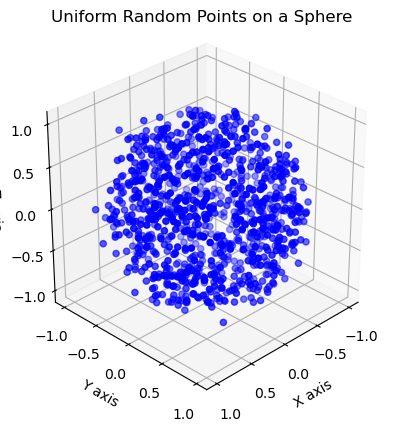

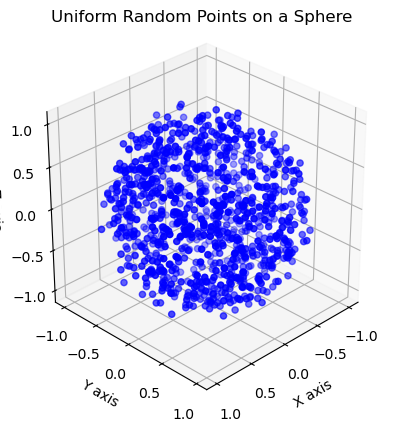

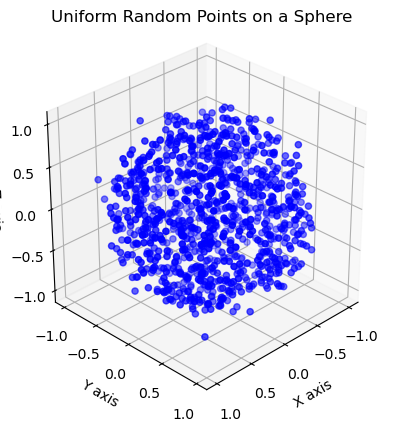

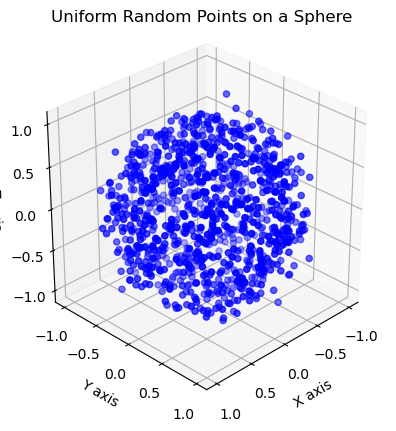

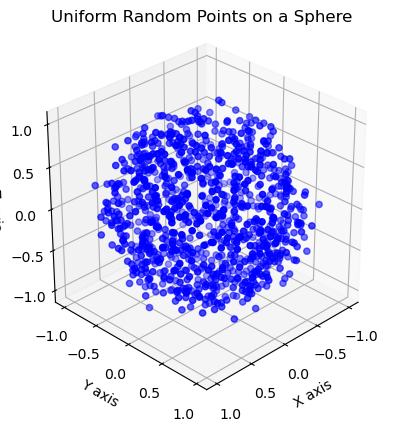

  5%|███▉                                                                           | 5/100 [26:34<7:17:50, 276.53s/it]

Epoch [5/100] | Loss: 0.1763 | Val Loss: 0.1665
out


999it [00:52, 18.89it/s]


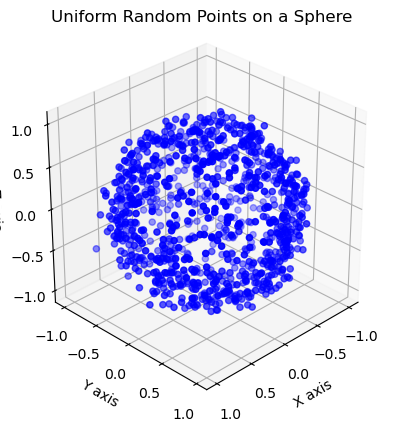

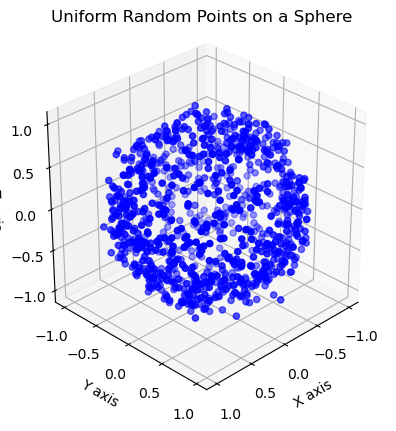

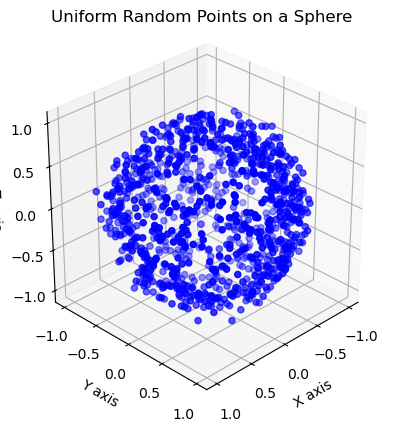

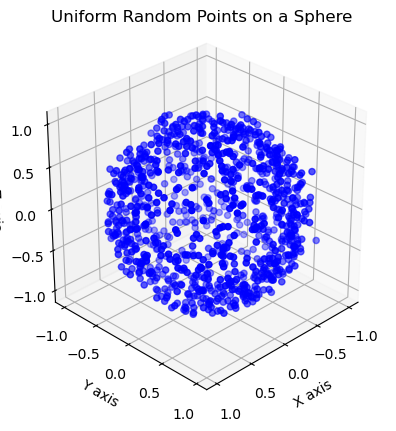

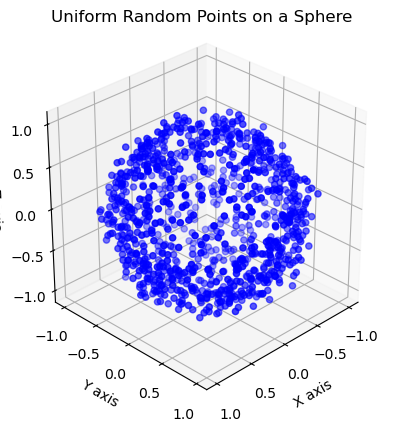

  6%|████▋                                                                          | 6/100 [30:33<6:53:17, 263.80s/it]

Epoch [6/100] | Loss: 0.1738 | Val Loss: 0.1814
out


999it [00:54, 18.19it/s]


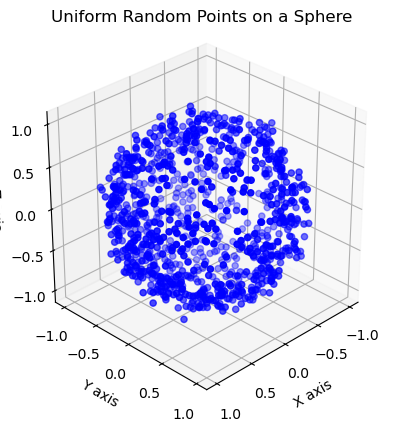

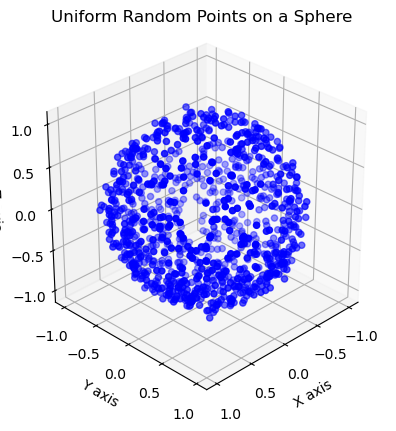

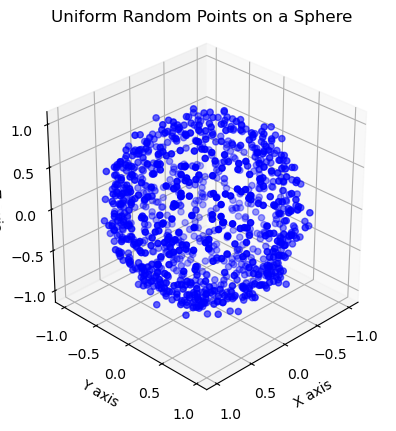

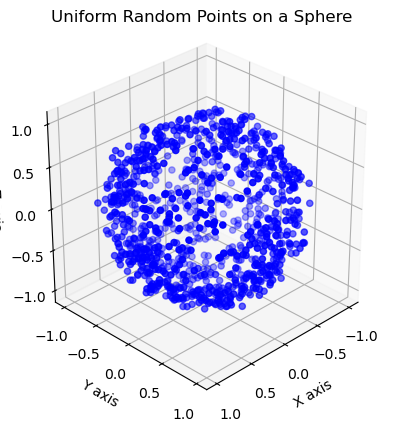

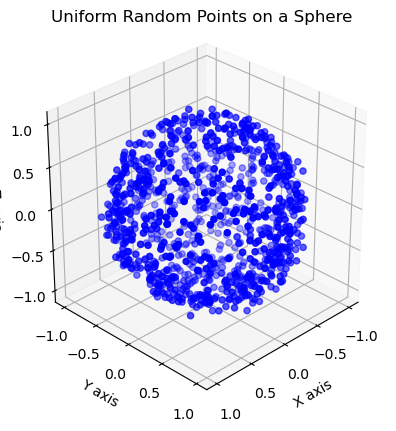

  7%|█████▌                                                                         | 7/100 [34:35<6:38:04, 256.82s/it]

Epoch [7/100] | Loss: 0.1448 | Val Loss: 0.1084
out


999it [00:52, 18.92it/s]


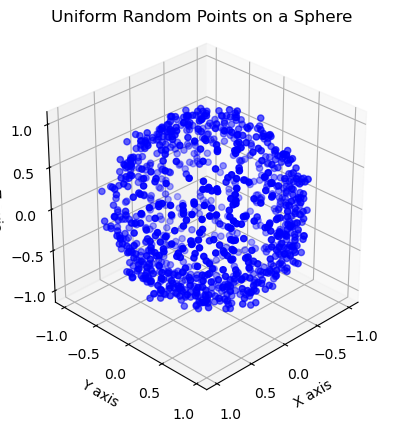

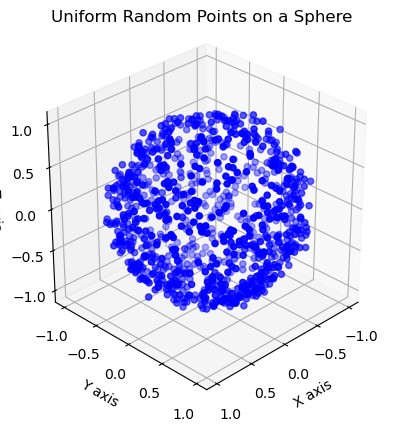

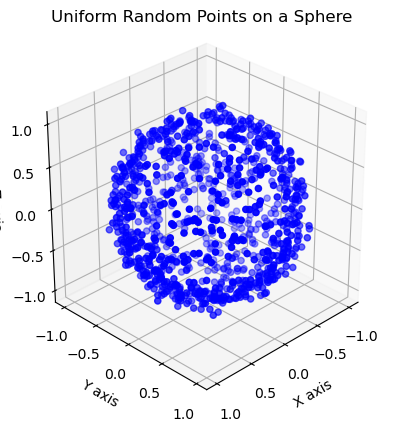

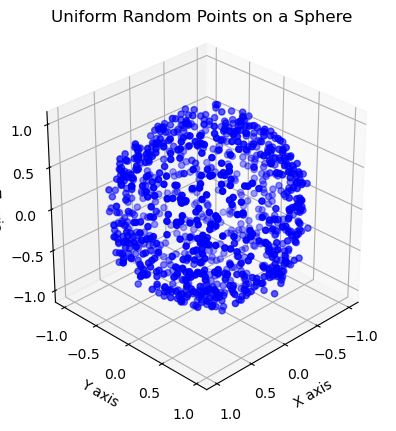

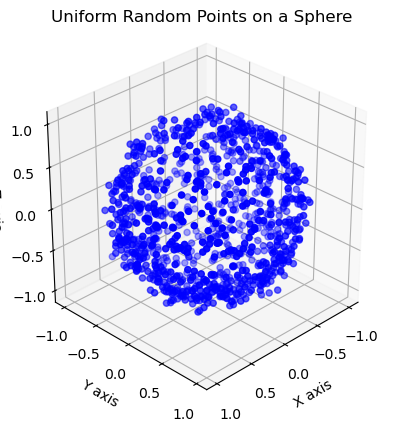

  8%|██████▎                                                                        | 8/100 [38:34<6:24:54, 251.03s/it]

Epoch [8/100] | Loss: 0.1205 | Val Loss: 0.2344
out


999it [00:55, 18.08it/s]


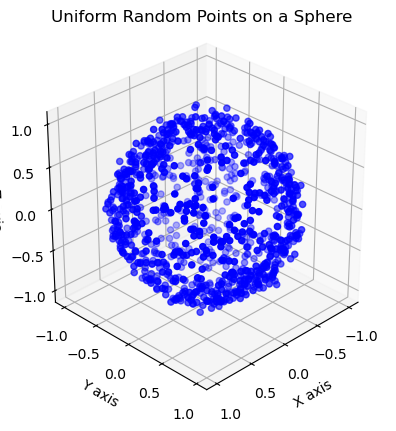

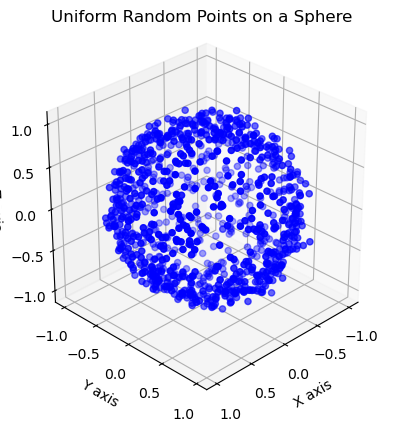

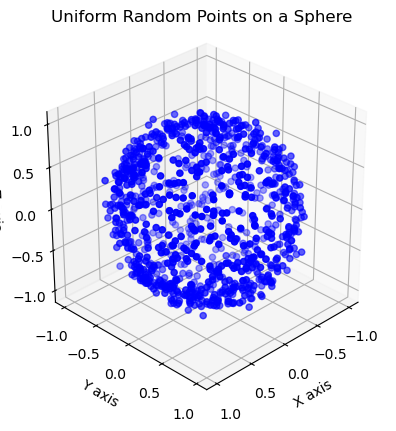

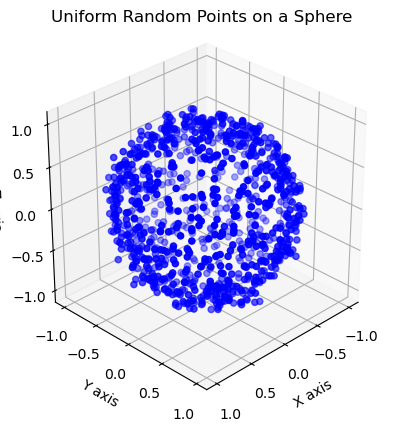

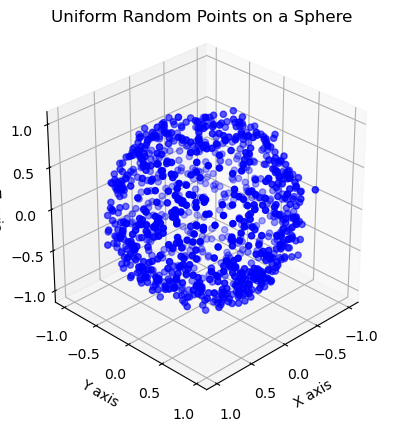

  9%|███████                                                                        | 9/100 [42:36<6:16:37, 248.32s/it]

Epoch [9/100] | Loss: 0.2293 | Val Loss: 0.1069
out


999it [00:53, 18.71it/s]


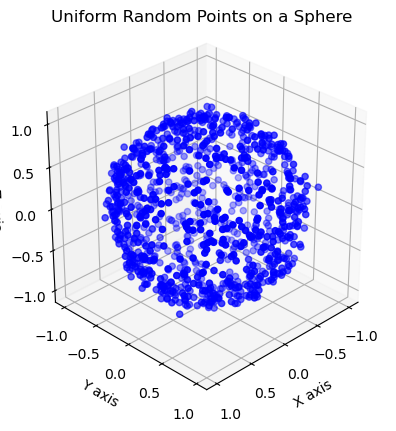

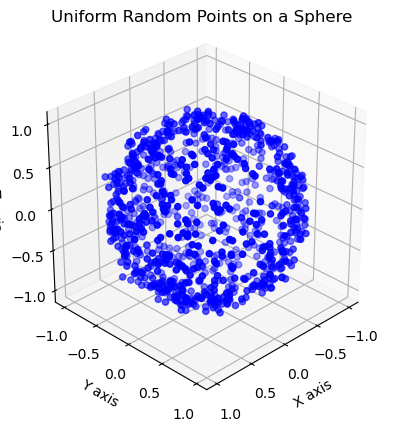

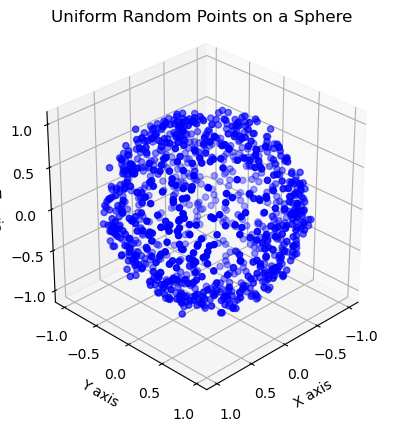

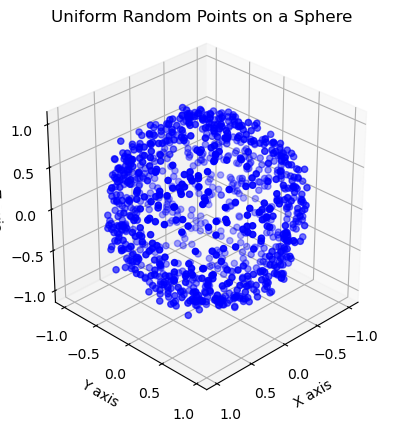

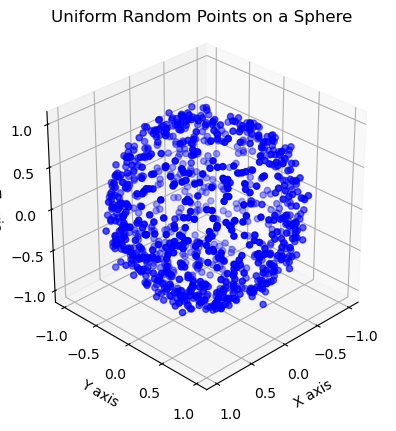

 10%|███████▊                                                                      | 10/100 [46:37<6:08:45, 245.83s/it]

Epoch [10/100] | Loss: 0.1525 | Val Loss: 0.1415
out


999it [00:54, 18.17it/s]


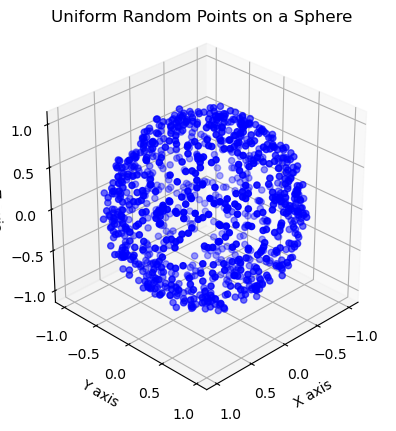

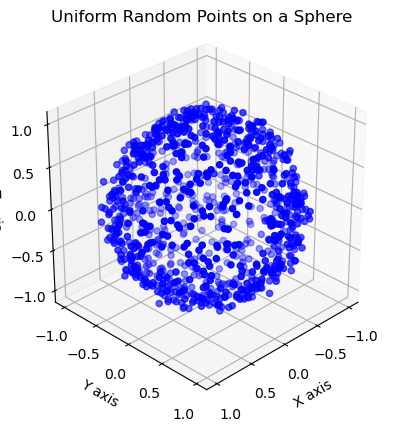

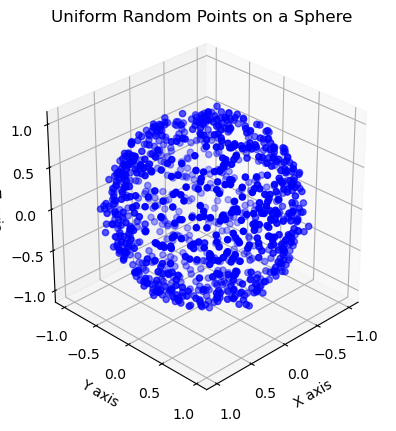

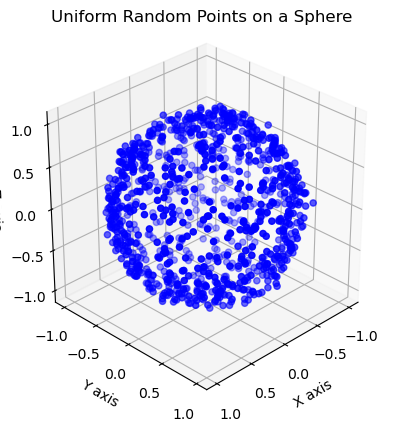

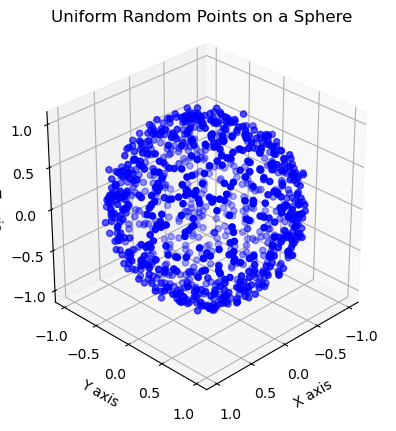

 11%|████████▌                                                                     | 11/100 [50:39<6:03:10, 244.83s/it]

Epoch [11/100] | Loss: 0.1705 | Val Loss: 0.1840
out


999it [00:52, 18.90it/s]


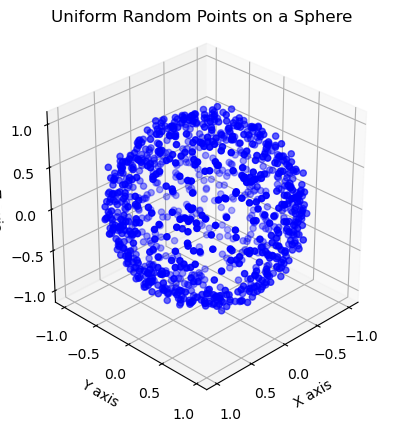

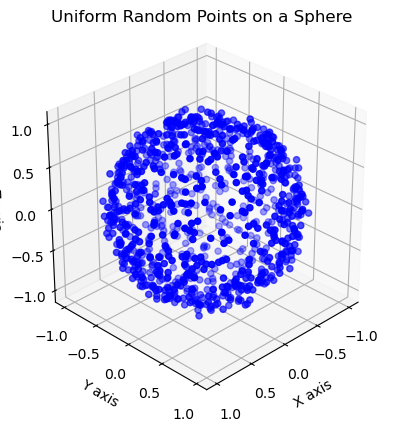

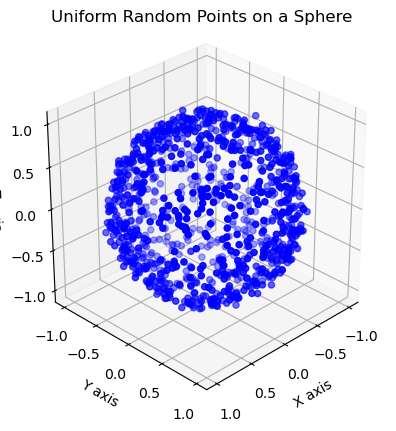

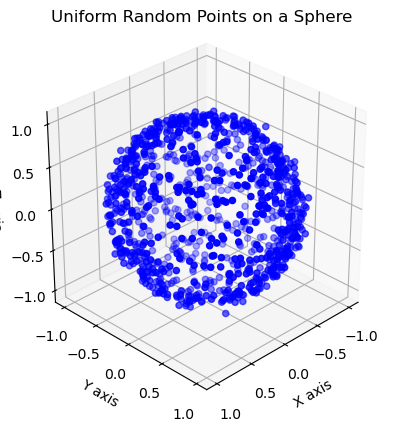

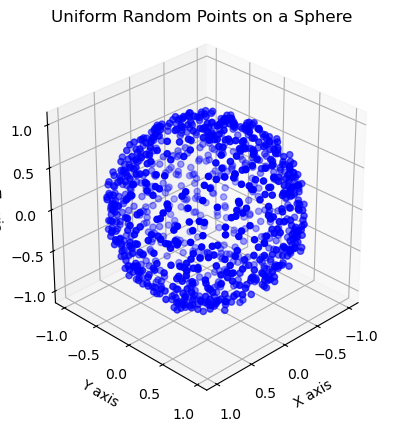

 12%|█████████▎                                                                    | 12/100 [54:38<5:56:23, 242.99s/it]

Epoch [12/100] | Loss: 0.1177 | Val Loss: 0.1155
out


999it [00:55, 18.15it/s]


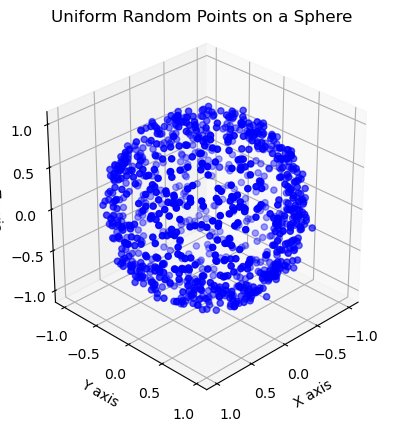

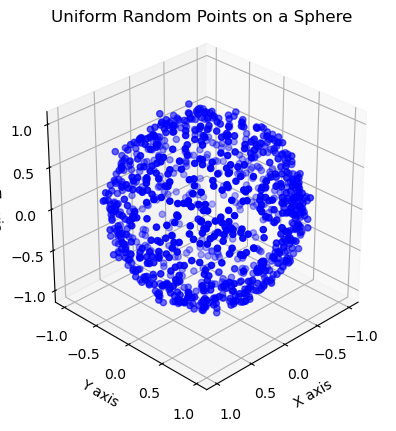

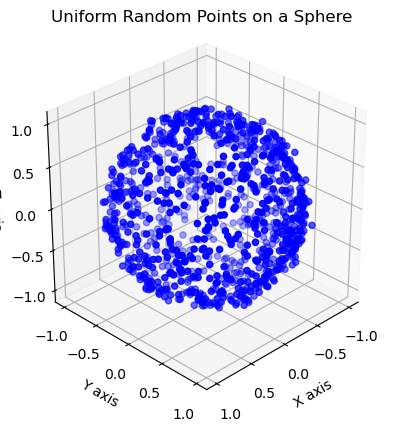

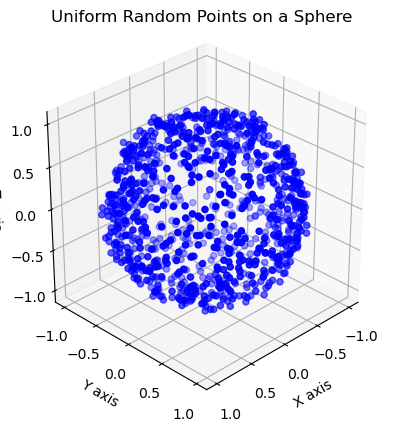

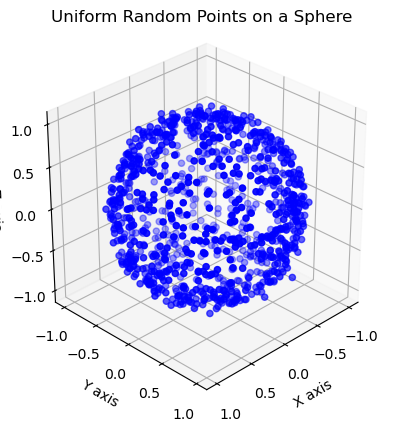

 13%|██████████▏                                                                   | 13/100 [58:41<5:52:25, 243.05s/it]

Epoch [13/100] | Loss: 0.1730 | Val Loss: 0.0767
out


999it [00:53, 18.82it/s]


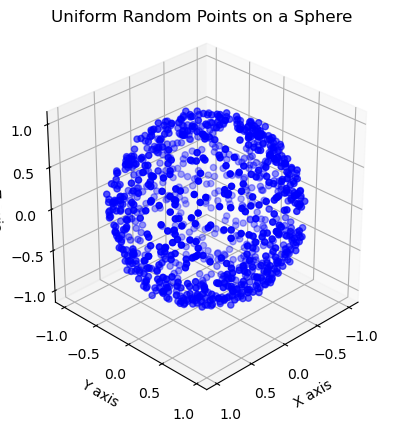

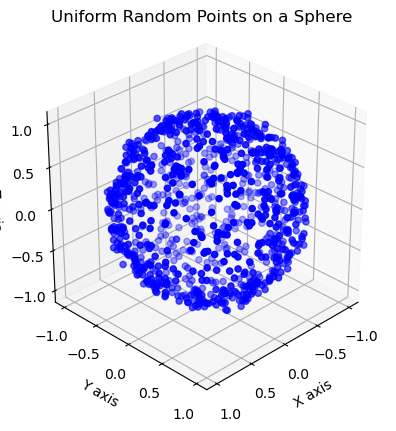

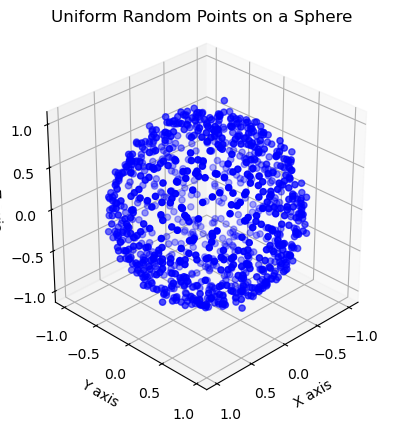

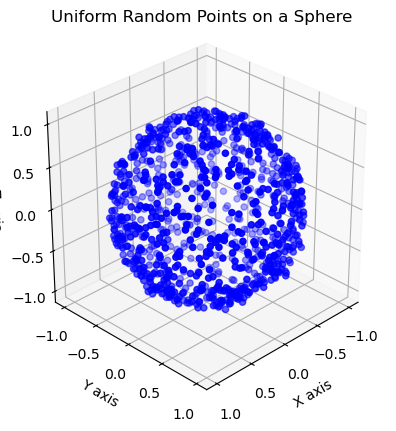

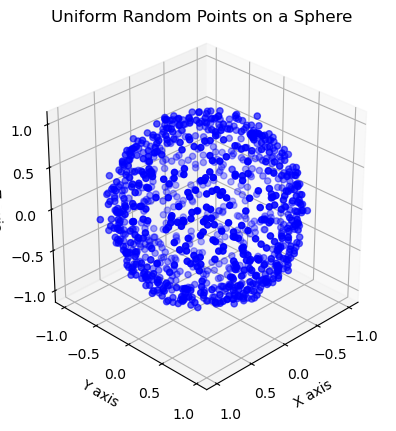

 14%|██████████▋                                                                 | 14/100 [1:02:40<5:46:39, 241.85s/it]

Epoch [14/100] | Loss: 0.1588 | Val Loss: 0.1688
out


999it [00:54, 18.21it/s]


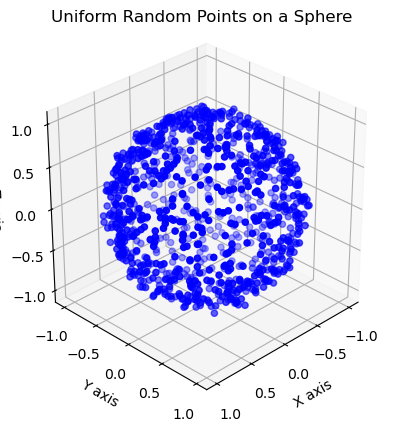

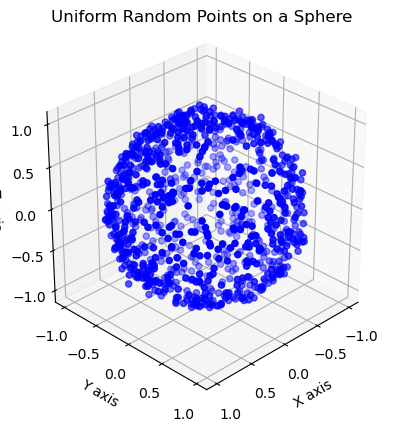

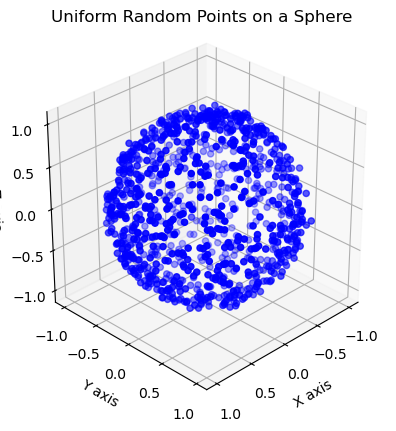

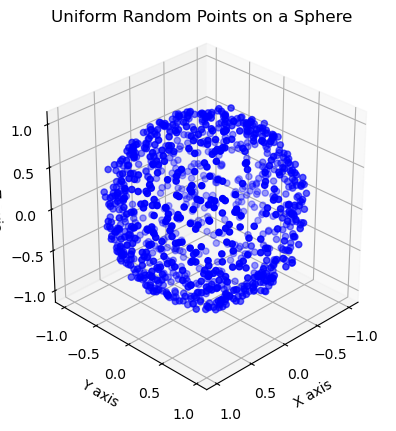

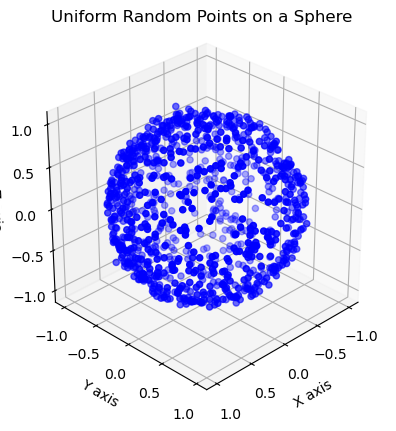

 15%|███████████▍                                                                | 15/100 [1:06:43<5:42:57, 242.09s/it]

Epoch [15/100] | Loss: 0.2226 | Val Loss: 0.2414


In [ ]:
EPOCHS = 100
batch_size = 32
image_size = 1000
learning_rate = 3e-4

# Import dataset

model = UNet().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
loss_fn = nn.MSELoss()
diffusion = Diffusion(img_size=image_size, device=device)
length = len(train_data)
val_losses = []
train_loss = []

for epoch in tqdm(range(EPOCHS)):
    for x in train_loader:
        optimizer.zero_grad()
        x = x[0]
        x = x.to(device)
        t = diffusion.sample_timesteps(x.shape[0]).to(device)
        x_t, noise = diffusion.noise_images(x, t)
        
        predicted_noise = model(x_t, t)
        loss = loss_fn(noise, predicted_noise)
        loss.backward()
        optimizer.step()
    with torch.no_grad():
        model.eval()
        for x in val_loader:
            x = x[0]
            x = x.to(device)
            t = diffusion.sample_timesteps(x.shape[0]).to(device)
            x_t, noise = diffusion.noise_images(x, t)
        
            predicted_noise = model(x_t, t)
            val_loss = loss_fn(noise, predicted_noise)
            
    print('out')
    sampled_images = diffusion.sample(model, 5)
    for i in sampled_images:
        x, y, z = i.detach().cpu().numpy()
        visualize(x, y, z)
        
    print(f"Epoch [{epoch+1}/100] | Loss: {loss.item():.4f} | Val Loss: {val_loss.item():.4f}")
    train_loss.append(loss.item())
    val_losses.append(val_loss.item())
    
        


In [17]:
print(x.shape)

torch.Size([1000])
